# Mt. St. Helens Binary Wet Snow Maps

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio as rio
import pystac
import pystac_client
import stackstac
import matplotlib.pyplot as plt
import xarray as xr
from datetime import datetime
import matplotlib
import ipyleaflet
import sys
import os
import dask_gateway
import planetary_computer
from rechunker import rechunk
sys.path.append('../../../sar_snowmelt_timing')
import s1_rtc_bs_utils
import contextily as ctx
import rioxarray as rxr
import skimage
import pathlib
import glob
import re
import time
import fsspec

In [2]:
#### CODE FOR DEVELOPMENT-- THIS RELOADS s1_rtc_bs_utils MODULE
sys.modules.pop('s1_rtc_bs_utils')
import s1_rtc_bs_utils

In [3]:
#cluster = dask_gateway.GatewayCluster()
#client = cluster.get_client()
#cluster.adapt(minimum=2, maximum=400)
#print(client.dashboard_link)

# Read in shapefiles and plot

In [4]:
name = 'Mt. St. Helens (46.19N)'
geojson = 'shapefiles/MSH.geojson'     

In [33]:
bbox_gdf = gpd.read_file(geojson)
ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac_pc(bbox_gdf,start_time='2019-01-01',end_time='2019-12-31',polarization='all')
#ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac_odc_pc(bbox_gdf,start_time='2019-01-01',end_time='2019-12-31') #odc stac doesnt work here.... relative orbit assignments wrong?

In [6]:
lava_flows = gpd.read_file('shapefiles/Lava_Flows.shp').to_crs(ts_ds.rio.crs)
lahars = gpd.read_file('shapefiles/Lahar_deposits.shp').to_crs(ts_ds.rio.crs)
pyroclastic = gpd.read_file('shapefiles/PFdeposits.shp').to_crs(ts_ds.rio.crs)

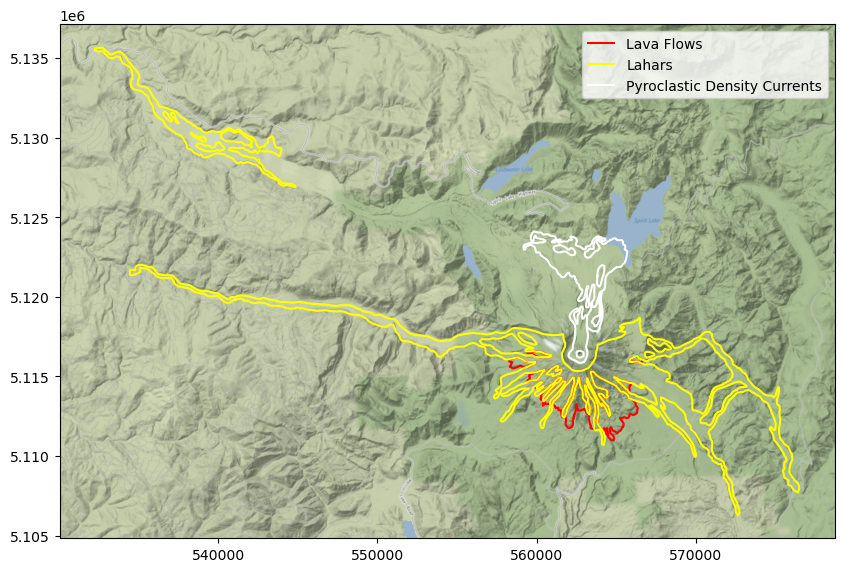

In [7]:
f,ax=plt.subplots(figsize=(10,10))
lava_flows.geometry.boundary.plot(ax=ax,color='red',label='Lava Flows')
lahars.geometry.boundary.plot(ax=ax,color='yellow',label='Lahars')
pyroclastic.geometry.boundary.plot(ax=ax,color='white',label='Pyroclastic Density Currents')
ctx.add_basemap(ax=ax, crs=ts_ds.rio.crs, source=ctx.providers.Stamen.Terrain, attribution=False)
ax.legend()

# Sentinel-1 Overpass Times Context

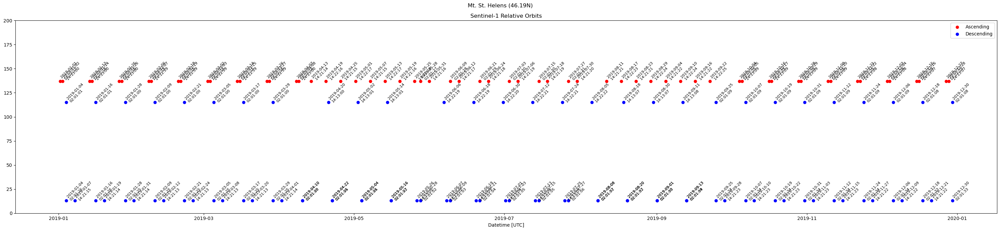

In [31]:
f,ax=plt.subplots(figsize=(30,7))
    
s1_rtc_bs_utils.plot_sentinel1_acquisitons(ts_ds,ax=ax)

f.suptitle(f'{name}')
plt.tight_layout()

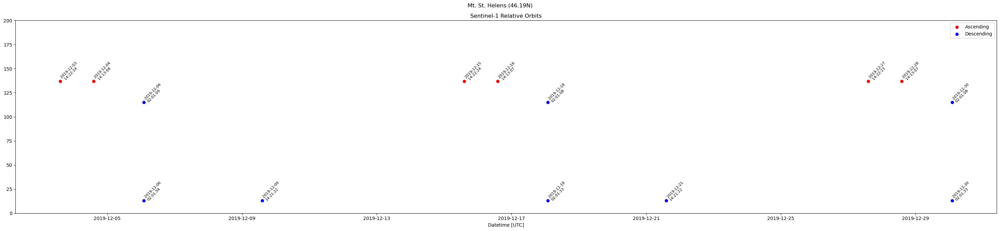

In [32]:
f,ax=plt.subplots(figsize=(30,7))

s1_rtc_bs_utils.plot_sentinel1_acquisitons(ts_ds.sel(time=slice('2019-12-01','2020-01-01')),ax=ax)

f.suptitle(f'{name}')
plt.tight_layout()

# Mask out treecover

In [10]:
classes = [ # page 13 of https://esa-worldcover.s3.amazonaws.com/v100/2020/docs/WorldCover_PUM_V1.0.pdf
#    10, # treecover
    20, # shrubland
    30, # grassland
    40, # cropland
#    50, # built-up
    60, #bare / sparse vegetation
    70, # snow and ice
#    80, # permanent water bodies
    90, # herbaceous wetlands
    95, # mangroves
    100 # loss and lichen
]

In [11]:
worldcover = s1_rtc_bs_utils.get_worldcover(ts_ds)
ts_ds = ts_ds.where(worldcover.isin(classes))

# Convert to dB

In [12]:
ts_ds_db = 10.0*np.log10(ts_ds)

# Now let's find the summertime average backscatter for each orbit and polarization

In [13]:
summer = slice('2019-06-01','2019-09-01')

In [14]:
summer_db = ts_ds_db.sel(time=summer).groupby('sat:relative_orbit').mean()

# Now let's subtract these summer averages from the time series to get ratio images for all polarizations and orbits

In [16]:
ratio_images = ts_ds_db.groupby('sat:relative_orbit')-summer_db

/srv/conda/envs/notebook/lib/python3.10/site-packages/xarray/core/indexing.py:1374: PerformanceWarning: Slicing with an out-of-order index is generating 31 times more chunks
  return self.array[key]


# Let's view a time series of the VV and VH ratio images for the month of December

In [18]:
december = slice('2019-12-01','2019-12-31')

In [19]:
ratio_images_december = ratio_images.sel(time=december).compute()

/srv/conda/envs/notebook/lib/python3.10/site-packages/flox/aggregations.py:258: RuntimeWarning: invalid value encountered in true_divide
  finalize=lambda sum_, count: sum_ / count,


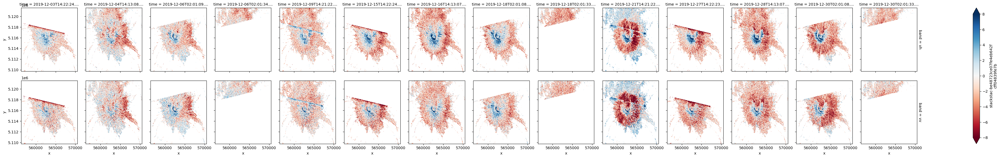

In [20]:
ratio_images_december.plot(row='band',col='time',vmin=-8,vmax=8,cmap='RdBu')

# Now we can combine the ratio images from the VV and VH polarizations using the method from Nagler et al. 2016 making use of local incidence angle. See https://www.mdpi.com/2072-4292/8/4/348

In [57]:
local_incidence_angles = s1_rtc_bs_utils.get_s1_rtc_stac(bbox_gdf,
                                                         polarization='incidence',
                                                         collection='../../../input/sentinel1-rtc-aws/mycollection_helens.json')

In [58]:
mean_local_incidence_angles = local_incidence_angles[local_incidence_angles['sat:relative_orbit'].isin(ratio_images['sat:relative_orbit'])].groupby('sat:relative_orbit').mean()

In [59]:
mean_local_incidence_angles = mean_local_incidence_angles.rio.write_crs(local_incidence_angles.crs)

In [60]:
lia = mean_local_incidence_angles.rio.reproject_match(ratio_images)

In [65]:
lia = lia/100

In [68]:
k = 0.5
theta1 = 20
theta2 = 45

In [69]:
W = xr.where(lia<theta1,1,k*(1 + ((theta2-lia)/(theta2-theta1)) ) )
W = xr.where(lia>theta2,k,W)

In [79]:
Rc = W*ratio_images.sel(band='vh').groupby('sat:relative_orbit') + (1-W)*ratio_images.sel(band='vv').groupby('sat:relative_orbit') 

In [85]:
binary_wet_snow = xr.where(Rc>2,1,np.nan)

# Now let's view these binary wet snow maps for December 15th and 16th

In [ ]:
dec1516 = slice('2019-12-15','2019-12-16')

/srv/conda/envs/notebook/lib/python3.10/site-packages/flox/aggregations.py:258: RuntimeWarning: invalid value encountered in true_divide
  finalize=lambda sum_, count: sum_ / count,


Text(0.5, 0.98, 'Binary Wet Snow Maps')

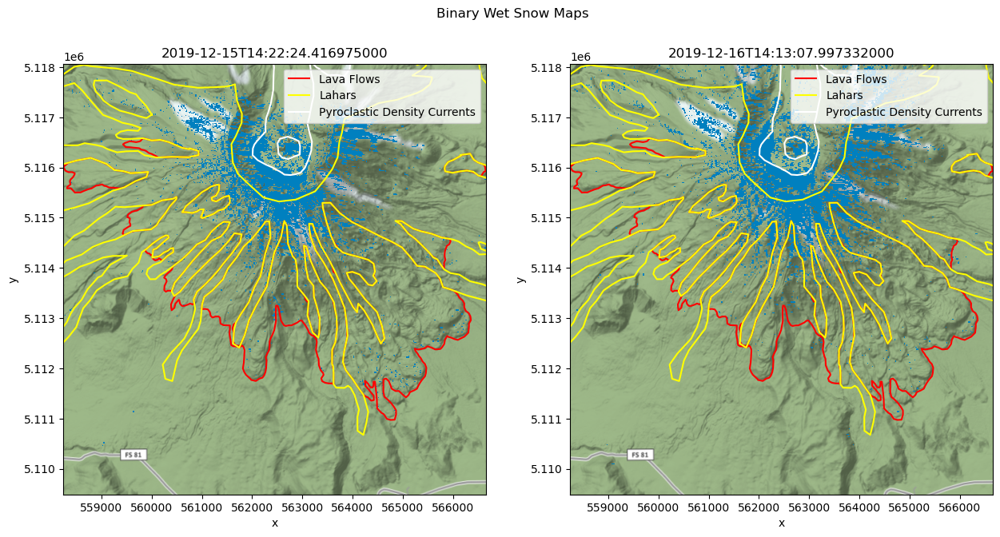

In [99]:
f,ax=plt.subplots(1,2,figsize=(15,7))

minx, miny, maxx, maxy = binary_wet_snow.rio.bounds()
minx, miny, maxx, maxy = lava_flows.total_bounds

binary_wet_snow.sel(time=dec1516).isel(time=0).plot(ax=ax[0],cmap='winter',vmin=1,add_colorbar=False)
binary_wet_snow.sel(time=dec1516).isel(time=1).plot(ax=ax[1],cmap='winter',vmin=1,add_colorbar=False)

ax[0].set_title(f'{binary_wet_snow.sel(time=dec1516).isel(time=0).time}')
ax[1].set_title(f'{binary_wet_snow.sel(time=dec1516).isel(time=1).time}')


for axs in ax:
    lava_flows.geometry.boundary.plot(ax=axs,color='red',label='Lava Flows')
    lahars.geometry.boundary.plot(ax=axs,color='yellow',label='Lahars')
    pyroclastic.geometry.boundary.plot(ax=axs,color='white',label='Pyroclastic Density Currents')
    ctx.add_basemap(ax=axs, crs=ts_ds.rio.crs, source=ctx.providers.Stamen.Terrain, attribution=False)
    axs.legend()
    
    axs.axis('equal')

    axs.set_xlim([minx,maxx])
    axs.set_ylim([miny,maxy])
    #axs.set_title('')
    
f.suptitle('Binary Wet Snow Maps')